# A personal exploratory notebook for Kaggle Data Sicence Bowl 2017 - Lung Cancer Detection, based on https://www.kaggle.com/c/data-science-bowl-2017/details/tutorial and https://www.kaggle.com/gzuidhof/data-science-bowl-2017/full-preprocessing-tutorial

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import os
import pandas as pd
from scipy.optimize import curve_fit, minimize
from scipy import stats

import time
%matplotlib inline

from scipy.spatial.distance import cdist

import dicom

from glob import glob
import SimpleITK as sitk

from skimage import measure, morphology
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

import seaborn as sns
try:
    sns.set_style("ticks") 
    #sns.set_style({"axes.axisbelow": False})
    sns.set_style({"xtick.direction": "in" ,"ytick.direction": "in"})
except:
    print("sns problem")

try:
    from mayavi import mlab
except:
    print("Can't import mayavi")
    

//anaconda/envs/py27/lib/python2.7/site-packages/matplotlib/font_manager.py:273: UserWarning: Matplotlib is building the font cache using fc-list. This may take a moment.
  warnings.warn('Matplotlib is building the font cache using fc-list. This may take a moment.')


# Get all scan ids in a dir and all files for a scan

In [129]:
base_dir = "./sample_images/"

#get ids for all scans/patients
def get_scan_ids(base_dir = "./sample_images/"):
    scans_ = []
    for scan_ in os.listdir(base_dir):
        if not scan_.startswith('.'):
            scans_.append(scan_)
    return scans_

all_scans = get_scan_ids()
#all_scans = os.listdir(base_dir)
#all_scans = glob(os.path.join(base_dir, '*'))

scan1 = "00cba091fa4ad62cc3200a657aeb957e"
scan1 = all_scans[0]


#get filenames of all slices for one scan/patient
def get_flist_one_scan(scan_token, base_dir = "./sample_images/"):
    f_list=glob(base_dir+scan_token+"/*.dcm")
    return f_list

f_list = get_flist_one_scan(scan1)
#print(f_list[:3])

#get slice thickness
def get_slice_thickness(scan_token, base_dir = "./sample_images/"):
    f_list_=get_flist_one_scan(scan_token, base_dir)
    dicoms_ = [dicom.read_file(f_) for f_ in f_list_]
    dicoms_.sort(key = lambda x: int(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(dicoms_[0].ImagePositionPatient[2] - dicoms_[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(dicoms_[0].SliceLocation - dicoms_[1].SliceLocation)
    return slice_thickness

#get slice spacings
def get_slice_spacings(scan_token, base_dir = "./sample_images/"):
    f_list_=get_flist_one_scan(scan_token, base_dir)
    dicoms_ = [dicom.read_file(f_) for f_ in f_list_]
    dicoms_.sort(key = lambda x: int(x.ImagePositionPatient[2]))
    try:
        slice_thickness = np.abs(dicoms_[0].ImagePositionPatient[2] - dicoms_[1].ImagePositionPatient[2])
    except:
        slice_thickness = np.abs(dicoms_[0].SliceLocation - dicoms_[1].SliceLocation)

    pixel_spacingsx = float(dicoms_[0].PixelSpacing[0])
    pixel_spacingsy = float(dicoms_[0].PixelSpacing[1])

    return slice_thickness, pixel_spacingsx, pixel_spacingsy



#get data of all slices for one scan/patient
def get_slices_one_scan(scan_token, base_dir = "./sample_images/"):
    f_list_=get_flist_one_scan(scan_token, base_dir)
    dicoms_ = [dicom.read_file(f_) for f_ in f_list_]
    dicoms_.sort(key = lambda x: int(x.ImagePositionPatient[2]))
        
    num_slices = len(f_list_)
    #we verified that all slices are 512x512
    slices = np.zeros((num_slices, 512, 512)).astype('float')

    for i, slice_ in enumerate(dicoms_):
        #ds_ = dicom.read_file(slice_f_)
        slices[i] = slice_.pixel_array
    #replace non-measurements with 0s
    slices[slices==-2000]=0
    return slices


In [19]:
print("There are {0} scans in dir {1}".format(len(all_scans), base_dir))

There are 20 scans in dir ./sample_images/


# resampling with a fixed interval

In [127]:
import scipy.ndimage.interpolation as interp

def resample(slices, scan_token, new_spacing=[1,1,1]):
    # Determine current pixel spacing
    slice_thickness, pixel_spacingsx, pixel_spacingsy = get_slice_spacings(scan_token, base_dir = "./sample_images/")
    spacing = np.array([slice_thickness, pixel_spacingsx, pixel_spacingsy])

    resize_factor = spacing / new_spacing
    new_real_shape = slices.shape * resize_factor
    new_shape = np.round(new_real_shape)
    real_resize_factor = new_shape / slices.shape
    new_spacing = spacing / real_resize_factor
    
    slices = interp.zoom(slices, real_resize_factor, mode='nearest')
    
    return slices, new_spacing



# Visualizing a slice of CT scan

In [4]:
#ds1 = dicom.read_file("sample_images/00cba091fa4ad62cc3200a657aeb957e/034673134cbef5ea15ff9e0c8090500a.dcm")
ds1 = dicom.read_file(f_list[0])
ds1

(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: CT Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.840.113654.2.55.249139163741242644304020243485943527041
(0008, 0060) Modality                            CS: 'CT'
(0008, 103e) Series Description                  LO: 'Axial'
(0010, 0010) Patient's Name                      PN: '00cba091fa4ad62cc3200a657aeb957e'
(0010, 0020) Patient ID                          LO: '00cba091fa4ad62cc3200a657aeb957e'
(0010, 0030) Patient's Birth Date                DA: '19000101'
(0018, 0060) KVP                                 DS: ''
(0020, 000d) Study Instance UID                  UI: 2.25.86208730140539712382771890501772734277950692397709007305473
(0020, 000e) Series Instance UID                 UI: 2.25.11575877329635228925808596800269974740893519451784626046614
(0020, 0011) Series Number                       IS: '3'
(0020, 0012) Acquisition Number            

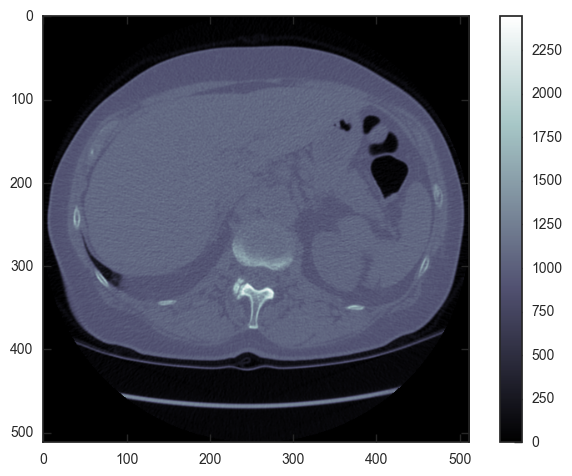

In [26]:
test_slice = ds1.pixel_array
test_slice[test_slice==-2000]=0
plt.imshow(test_slice, cmap=plt.cm.bone)
plt.colorbar()

In [28]:
test_slice.shape

(512, 512)

In [32]:
#itk_img1 = sitk.ReadImage(f_list) 
itk_img1 = sitk.ReadImage(f_list[0]) 

itk_img_array = sitk.GetArrayFromImage(itk_img1) # indexes are z,y,x (notice the ordering)
itk_img_array[itk_img_array==-3024] = 0

In [33]:
itk_img_array

array([[[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ..., 
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]]], dtype=int32)

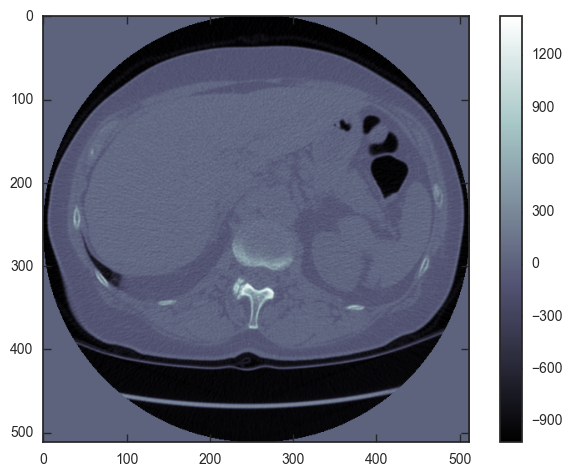

In [34]:
plt.imshow(itk_img_array[0], cmap=plt.cm.bone)
plt.colorbar()

In [37]:
print("SimpleITK and pydicom image arrays are offset by {0}".format(np.unique(test_slice-itk_img_array)))


SimpleITK and pydicom image arrays are offset by [   0 1024]


# The distributions of pixel spacing, slice thickness, and scan size 

In [38]:
ds1.PixelSpacing

['0.597656', '0.597656']

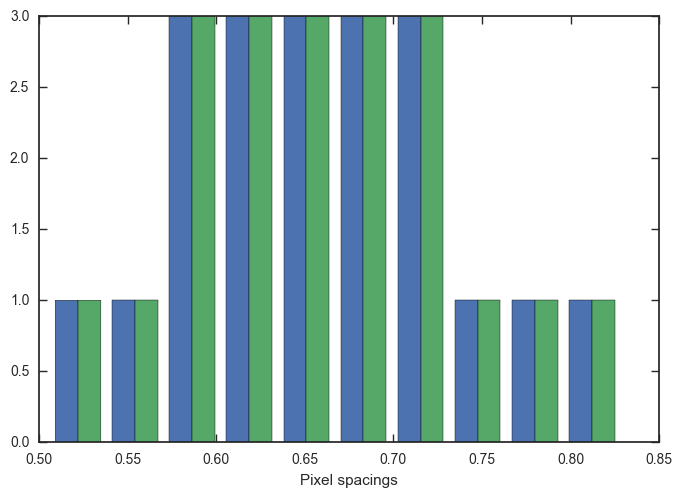

In [117]:
pixel_spacings = np.zeros((len(all_scans), 2)).astype('float')
scan_sizes = np.zeros((len(all_scans), 2)).astype('float')
slice_thicknesses = np.zeros(len(all_scans)).astype('float')

for i, s in enumerate(all_scans):
    scan_ = get_flist_one_scan(s)
    ds_ = dicom.read_file(scan_[0])
    pixel_spacings[i,0] = float(ds_.PixelSpacing[0])
    pixel_spacings[i,1] = float(ds_.PixelSpacing[1])
    sthick = get_slice_thickness(s, base_dir = "./sample_images/")
    slice_thicknesses[i] = sthick
    scan_sizes[i,0] = float(ds_.pixel_array.shape[0])
    scan_sizes[i,1] = float(ds_.pixel_array.shape[1])


plt.hist(pixel_spacings, bins=10)
plt.xlabel("Pixel spacings")


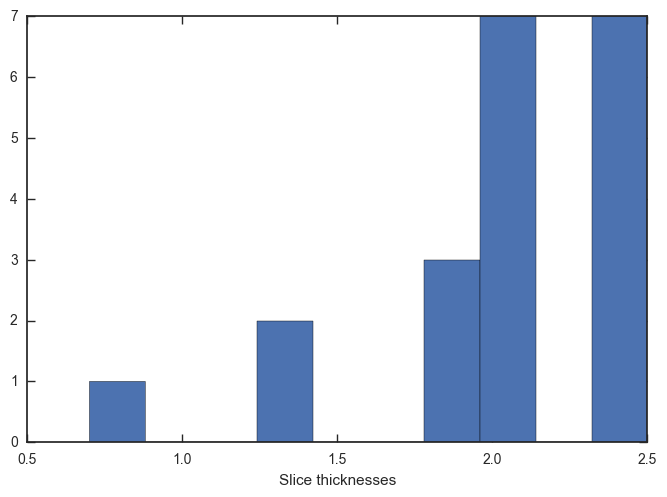

In [120]:
plt.hist(slice_thicknesses, bins=10)
plt.xlabel("Slice thicknesses")



In [121]:
print("All slices have the same image size {0:.0f} x {1:.0f}".format(np.unique(scan_sizes[0:])[0], np.unique(scan_sizes[1:])[0]))

All slices have the same image size 512 x 512


# Visualizing all slices of a scan

In [73]:
#get the ground truth first:
df_truth = pd.read_csv('./stage1_labels.csv')
df_truth.head()


,id,cancer
0,0015ceb851d7251b8f399e39779d1e7d,1
1,0030a160d58723ff36d73f41b170ec21,0
2,003f41c78e6acfa92430a057ac0b306e,0
3,006b96310a37b36cccb2ab48d10b49a3,1
4,008464bb8521d09a42985dd8add3d0d2,1


In [88]:
base_dir = "./sample_images/"
sample_ncs=[]
for nc_ in df_truth.id[df_truth.cancer==0]:
    if glob(base_dir+nc_+"/*.dcm"):
        sample_ncs.append(nc_)

sample_cs=[]
for c_ in df_truth.id[df_truth.cancer==1]:
    if glob(base_dir+c_+"/*.dcm"):
        sample_cs.append(c_)


print("Non-cancer scans in sample images: {0}".format(sample_ncs))
print("Cancer scans in sample images: {0}".format(sample_cs))



Non-cancer scans in sample images: ['00cba091fa4ad62cc3200a657aeb957e', '0a099f2549429d29b32f349e95fb2244', '0a0c32c9e08cc2ea76a71649de56be6d', '0a38e7597ca26f9374f8ea2770ba870d', '0bd0e3056cbf23a1cb7f0f0b18446068', '0c59313f52304e25d5a7dcf9877633b1', '0c98fcb55e3f36d0c2b6507f62f4c5f1', '0c9d8314f9c69840e25febabb1229fa4', '0ca943d821204ceb089510f836a367fd', '0d19f1c627df49eb223771c28548350e', '0d2fcf787026fece4e57be167d079383', '0d941a3ad6c889ac451caf89c46cb92a', '0ddeb08e9c97227853422bd71a2a695e', '0de72529c30fe642bc60dcb75c87f6bd']
Cancer scans in sample images: ['0acbebb8d463b4b9ca88cf38431aac69', '0c0de3749d4fe175b7a5098b060982a1', '0c37613214faddf8701ca41e6d43f56e', '0c60f4b87afcb3e2dfa65abbbf3ef2f9', '0d06d764d3c07572074d468b4cff954f']


## A scan diagnosed as lung cancer within a year

In [134]:
cancer_id1=sample_cs[0]
print("Example cancer patient id: {0}".format(cancer_id1))
slices1 = get_slices_one_scan(all_scans[all_scans==cancer_id1])
num_scans1 = slices1.shape[0]
#slices1.shape
print("resampling...")
slices1_resample, new_spacing1 = resample(slices1, cancer_id1, new_spacing=[0.5,0.5,0.5])


Example cancer patient id: 0acbebb8d463b4b9ca88cf38431aac69
resampling


In [137]:
print("Raw shape: {0}".format(slices1.shape))
print("Resampled shape: {0}".format(slices1_resample.shape))


Raw shape: (134, 512, 512)
Resampled shape: (482, 558, 558)


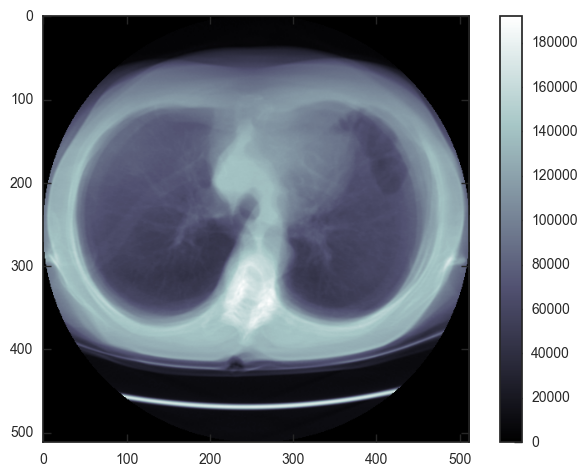

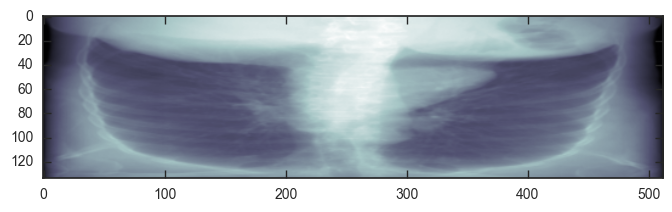

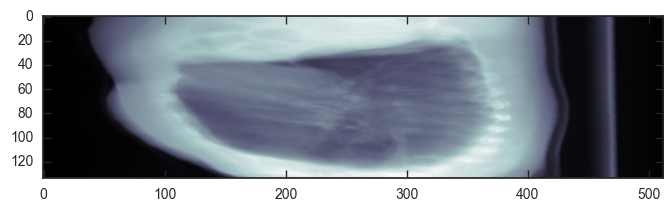

In [132]:
projectionZ = np.sum(slices1, axis=0)
projectionX = np.sum(slices1, axis=1)
projectionY = np.sum(slices1, axis=2)

print("Projected images, raw scales")
plt.imshow(projectionZ, cmap=plt.cm.bone)
plt.colorbar()
plt.show()

plt.imshow(projectionX, cmap=plt.cm.bone)
plt.show()

plt.imshow(projectionY, cmap=plt.cm.bone)
plt.show()

Resampled projected images


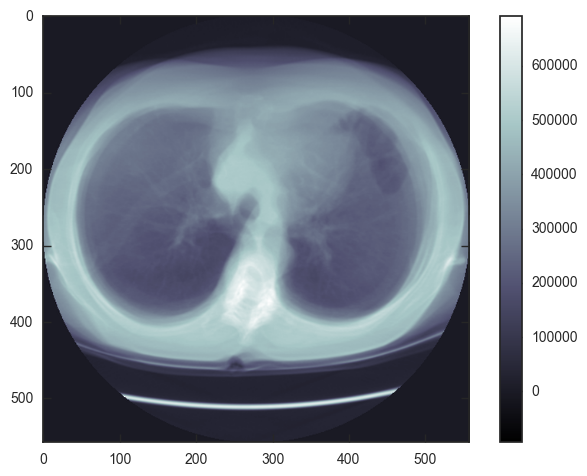

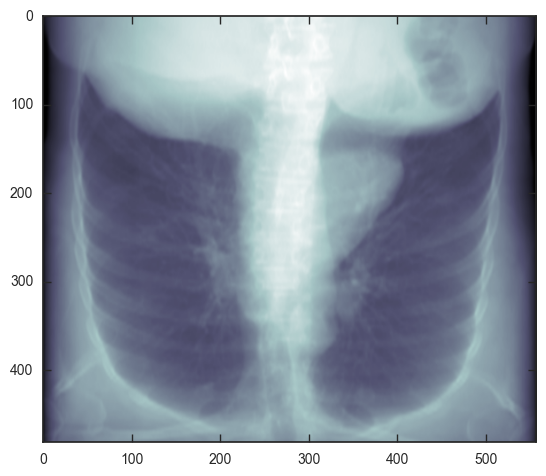

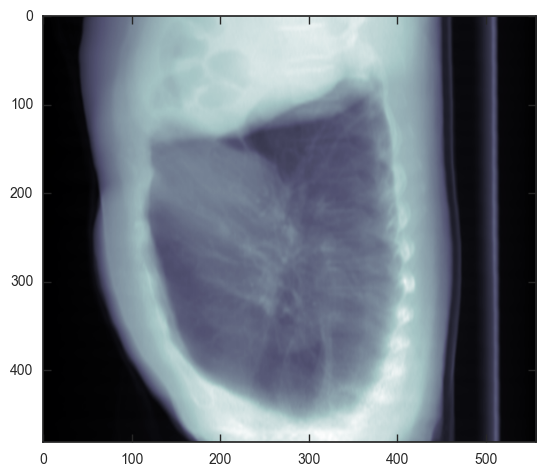

In [138]:
projectionZ_resample = np.sum(slices1_resample, axis=0)
projectionX_resample = np.sum(slices1_resample, axis=1)
projectionY_resample = np.sum(slices1_resample, axis=2)

print("Resampled projected images")

plt.imshow(projectionZ_resample, cmap=plt.cm.bone)
plt.colorbar()
plt.show()

plt.imshow(projectionX_resample, cmap=plt.cm.bone)
plt.show()

plt.imshow(projectionY_resample, cmap=plt.cm.bone)
plt.show()


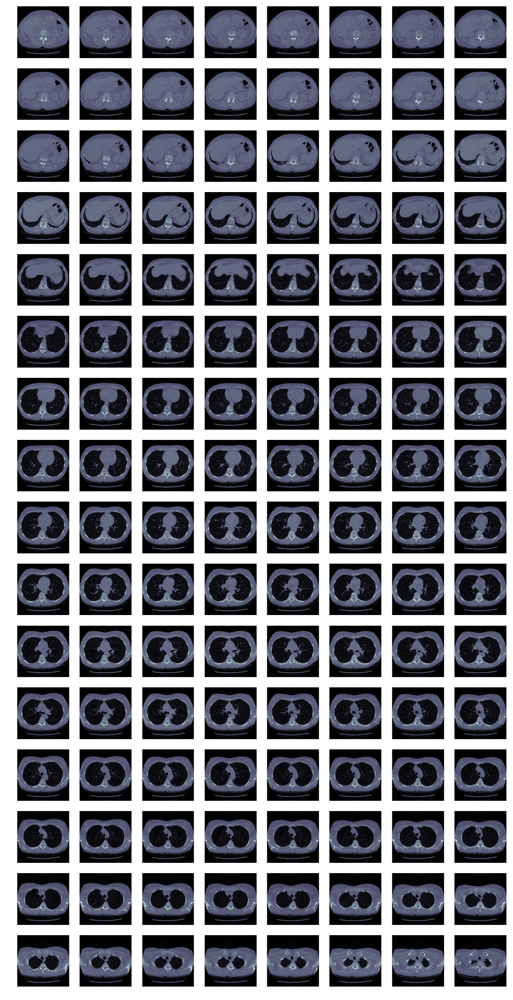

In [95]:
ncols=8
fig, axes = plt.subplots(num_scans1//ncols, ncols, sharex='all', sharey='all', figsize=(ncols*2, num_scans1//ncols*2))
for i in range(num_scans1//ncols*ncols):
    axes[i//ncols, i%ncols].axis('off')
    axes[i//ncols, i%ncols].imshow(slices1[i], cmap=plt.cm.bone)

#plt.tight_layout()

## A scan not diagnosed as lung cancer within a year

In [96]:
#non_cancer_id1=df_truth.id[df_truth.cancer==0].values[0]
non_cancer_id1=sample_ncs[0]

print("Example cancer patient id: {0}".format(non_cancer_id1))
nc_slices1 = get_slices_one_scan(all_scans[all_scans==non_cancer_id1])
nc_num_scans1 = nc_slices1.shape[0]
nc_slices1.shape

Example cancer patient id: 00cba091fa4ad62cc3200a657aeb957e


(134, 512, 512)

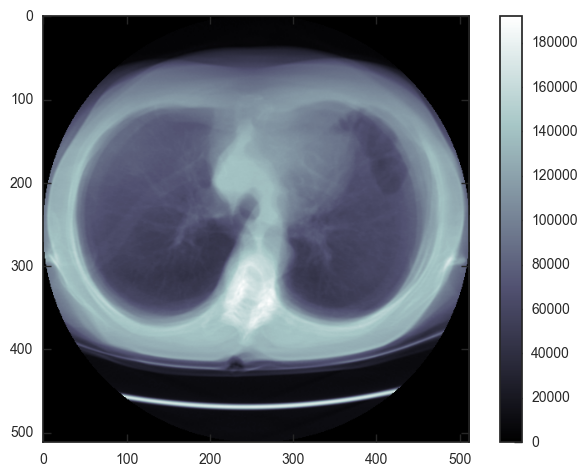

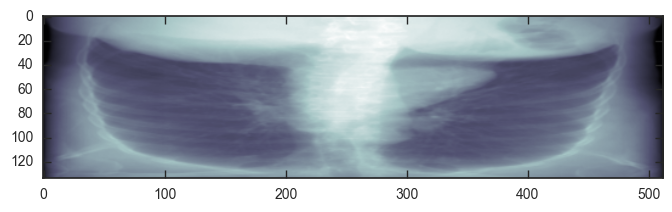

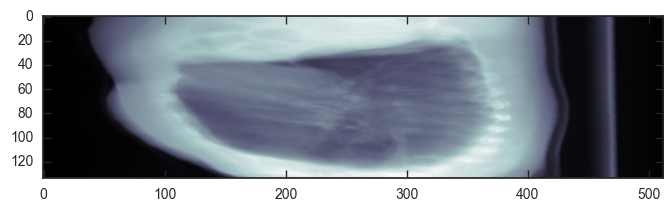

In [98]:
nc_projectionZ = np.sum(nc_slices1, axis=0)
nc_projectionX = np.sum(nc_slices1, axis=1)
nc_projectionY = np.sum(nc_slices1, axis=2)

plt.imshow(nc_projectionZ, cmap=plt.cm.bone)
plt.colorbar()
plt.show()

plt.imshow(nc_projectionX, cmap=plt.cm.bone)
plt.show()

plt.imshow(nc_projectionY, cmap=plt.cm.bone)
plt.show()





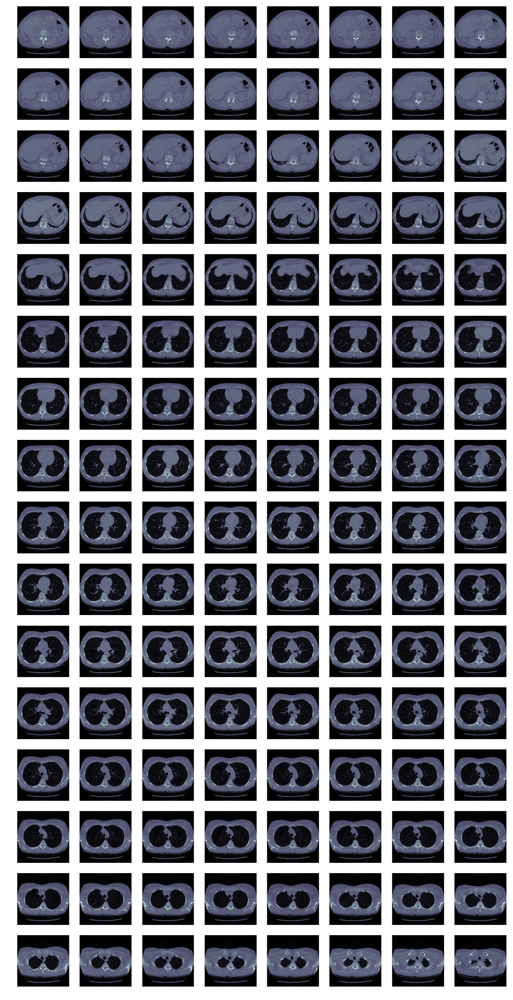

In [99]:
ncols=8
fig, axes = plt.subplots(nc_num_scans1//ncols, ncols, sharex='all', sharey='all', 
                         figsize=(ncols*2, nc_num_scans1//ncols*2))
for i in range(nc_num_scans1//ncols*ncols):
    axes[i//ncols, i%ncols].axis('off')
    axes[i//ncols, i%ncols].imshow(nc_slices1[i], cmap=plt.cm.bone)

#plt.tight_layout()
plt.show()



In [139]:
def plot_3d(image, threshold=-300):
    
    # Position the scan upright, 
    # so the head of the patient would be at the top facing the camera
    p = image.transpose(2,1,0)
    
    verts, faces = measure.marching_cubes(p, threshold)

    fig = plt.figure(figsize=(10, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Fancy indexing: `verts[faces]` to generate a collection of triangles
    mesh = Poly3DCollection(verts[faces], alpha=0.1)
    face_color = [0.5, 0.5, 1]
    mesh.set_facecolor(face_color)
    ax.add_collection3d(mesh)

    ax.set_xlim(0, p.shape[0])
    ax.set_ylim(0, p.shape[1])
    ax.set_zlim(0, p.shape[2])

    plt.show()
    

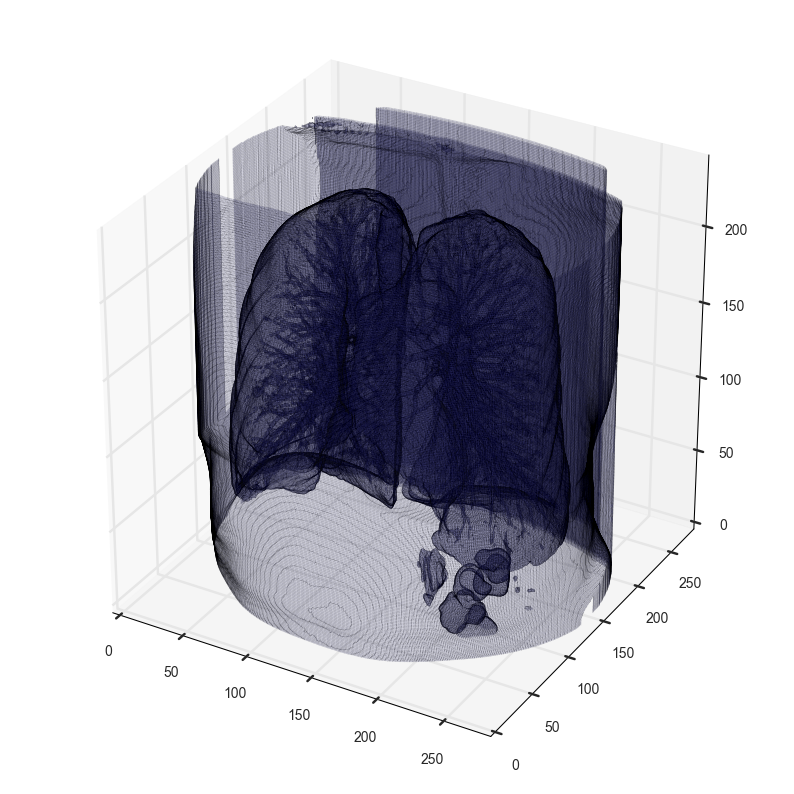

In [141]:
slices1_resample2, new_spacing1_2 = resample(slices1, cancer_id1, new_spacing=[1.,1.,1.])
plot_3d(slices1_resample2, 400)


In [ ]:
plot_3d(slices1_resample2, 400)



In [85]:
df_truth.id[df_truth.cancer==0]


1       0030a160d58723ff36d73f41b170ec21
2       003f41c78e6acfa92430a057ac0b306e
5       0092c13f9e00a3717fdc940641f00015
6       00986bebc45e12038ef0ce3e9962b51a
7       00cba091fa4ad62cc3200a657aeb957e
9       0121c2845f2b7df060945b072b2515d7
10      013395589c01aa01f8df81d80fb0e2b8
11      01de8323fa065a8963533c4a86f2f6c1
12      01e349d34c06410e1da273add27be25c
13      01f1140c8e951e2a921b61c9a7e782c2
14      024efb7a1e67dc820eb61cbdaa090166
16      0268f3a7a17412178cfb039e71799a80
17      026be5d5e652b6a7488669d884ebe297
20      0334c8242ce7ee1a6c1263096e4cc535
21      03fb0d0fdb187ee1160f09386b28c3f2
22      03ff23e445787886f8b0cb192b3c154d
23      043ed6cb6054cc13804a3dca342fa4d0
24      0482c444ac838adc5aa00d1064c976c1
25      04a3187ec2ed4198a25033071897bffc
26      04a52f49cdbfb8b99789b9e93f1ad319
28      04cfc5efa4c8c2a8944c8b9fa6cb04d1
29      04e5d435fa01b0958e3274be73312cac
30      04fca9fbec0b803326488ade96897f6e
33      05a20caf6ab6df4643644c953f06a5eb
35      0679e5fd

In [86]:
df_truth.id[df_truth.cancer==1]

0       0015ceb851d7251b8f399e39779d1e7d
3       006b96310a37b36cccb2ab48d10b49a3
4       008464bb8521d09a42985dd8add3d0d2
8       00edff4f51a893d80dae2d42a7f45ad1
15      0257df465d9e4150adef13303433ff1e
18      02801e3bbcc6966cb115a962012c35df
19      028996723faa7840bb57f57e28275e4c
27      04a8c47583142181728056310759dea1
31      05609fdb8fa0895ac8a9be373144dac7
32      059d8c14b2256a2ba4e38ac511700203
34      064366faa1a83fdcb18b2538f1717290
37      0708c00f6117ed977bbe1b462b56848c
38      07349deeea878c723317a1ce42cc7e58
40      07bca4290a2530091ce1d5f200d9d526
43      081f4a90f24ac33c14b61b97969b7f81
53      09d7c4a3e1076dcfcae2b0a563a28364
59      0acbebb8d463b4b9ca88cf38431aac69
61      0c0de3749d4fe175b7a5098b060982a1
62      0c37613214faddf8701ca41e6d43f56e
64      0c60f4b87afcb3e2dfa65abbbf3ef2f9
68      0d06d764d3c07572074d468b4cff954f
78      0f5ab1976a1b1ef1c2eb1d340b0ce9c4
82      0ff552aa083ecfabaf1cfd65b0a8e674
92      118be21b7e0c3058b29a524686391c66
95      11fe5426

2.5